In [1]:
import dlib
import cv2
import random
from os import listdir
from os.path import join
import time
from matplotlib import pyplot as plt
import numpy as np

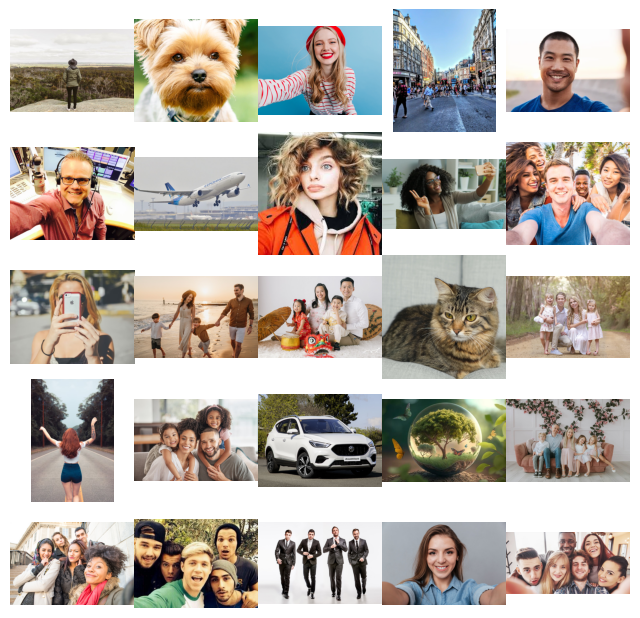

In [2]:
# Display grid of images
images = [cv2.imread(join("images", f)) for f in listdir("images")]
f, axarr = plt.subplots(len(images) // 5, 5)
plt.axis('off')
f.subplots_adjust(wspace=0, hspace=0)
f.set_figheight(8)
f.set_figwidth(8)
for i in range(5):
    for x in range(5):
        axarr[i,x].imshow(cv2.cvtColor(images[(i*5)+x], cv2.COLOR_RGB2BGR))
        axarr[i,x].axes.get_xaxis().set_visible(False)
        axarr[i,x].axes.get_xaxis().set_visible(False)
        axarr[i,x].axis('off')

In [3]:
# Based on: https://www.tutorialspoint.com/how-to-detect-eyes-in-an-image-using-opencv-python
face_classifier = cv2.CascadeClassifier("models/haarcascade_frontalface_default.xml")
eye_classifier = cv2.CascadeClassifier("models/haarcascade_eye_tree_eyeglasses.xml")

In [4]:
haargoogly = []

start = time.time()

for img in images:
    gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_classifier.detectMultiScale(gray_image, scaleFactor=1.1, minNeighbors=5, minSize=(40, 40))
    
    for (x, y, w, h) in faces:
        roi_gray = gray_image[y:y+h, x:x+w]
        roi_color = img[y:y+h, x:x+w]
        eyes = eye_classifier.detectMultiScale(roi_gray)
        for (ex, ey ,ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex,ey), (ex+ew, ey+eh), (0, 255, 0), 5)

    haargoogly.append(img)

end = time.time()
print(end - start)

0.6494991779327393


In [5]:
# Based on: https://stackoverflow.com/questions/58780684/opencv-not-detecting-eyes-correctly
sp = dlib.shape_predictor("models/shape_predictor_68_face_landmarks.dat")
detector = dlib.get_frontal_face_detector()

In [6]:
images = [cv2.imread(join("images", f)) for f in listdir("images")]
dlibgoogly = []

start = time.time()

for img in images:
    cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    detections = detector(img, 1)
    faces = dlib.full_object_detections()

    for det in detections:
        faces.append(sp(img, det))
    
    right_eyes = [[face.part(i) for i in range(36, 42)] for face in faces]
    left_eyes = [[face.part(i) for i in range(42, 48)] for face in faces]
    
    right_eyes = [(min(eye, key=lambda x: x.x).x, min(eye, key=lambda x: x.y).y, max(eye, key=lambda x: x.x).x, max(eye, key=lambda x: x.y).y) for eye in right_eyes]
    left_eyes = [(min(eye, key=lambda x: x.x).x, min(eye, key=lambda x: x.y).y, max(eye, key=lambda x: x.x).x, max(eye, key=lambda x: x.y).y) for eye in left_eyes]

    for (ex, ey ,ew, eh) in right_eyes + left_eyes:
        cv2.rectangle(img, (ex,ey), (ew, eh), (0, 255, 0), 5)
    
    dlibgoogly.append(img)

end = time.time()
print(end - start)

3.02750301361084


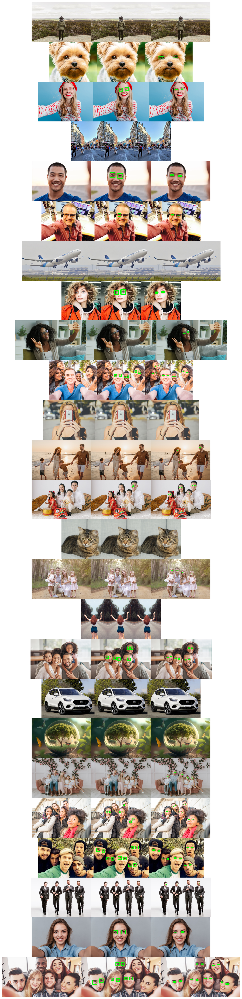

In [7]:
# Compare both appraoches
images = [cv2.imread(join("images", f)) for f in listdir("images")]
f, axarr = plt.subplots(len(dlibgoogly), 1)
plt.axis('off')
f.subplots_adjust(wspace=0, hspace=0)
f.set_figheight(60)
f.set_figwidth(60)
for i, (a, b, c) in enumerate(zip(images, haargoogly, dlibgoogly)):
    imgs = np.concatenate((a, b, c), axis=1)
    axarr[i].imshow(cv2.cvtColor(imgs, cv2.COLOR_RGB2BGR))
    axarr[i].axes.get_xaxis().set_visible(False)
    axarr[i].axes.get_xaxis().set_visible(False)
    axarr[i].axis('off')

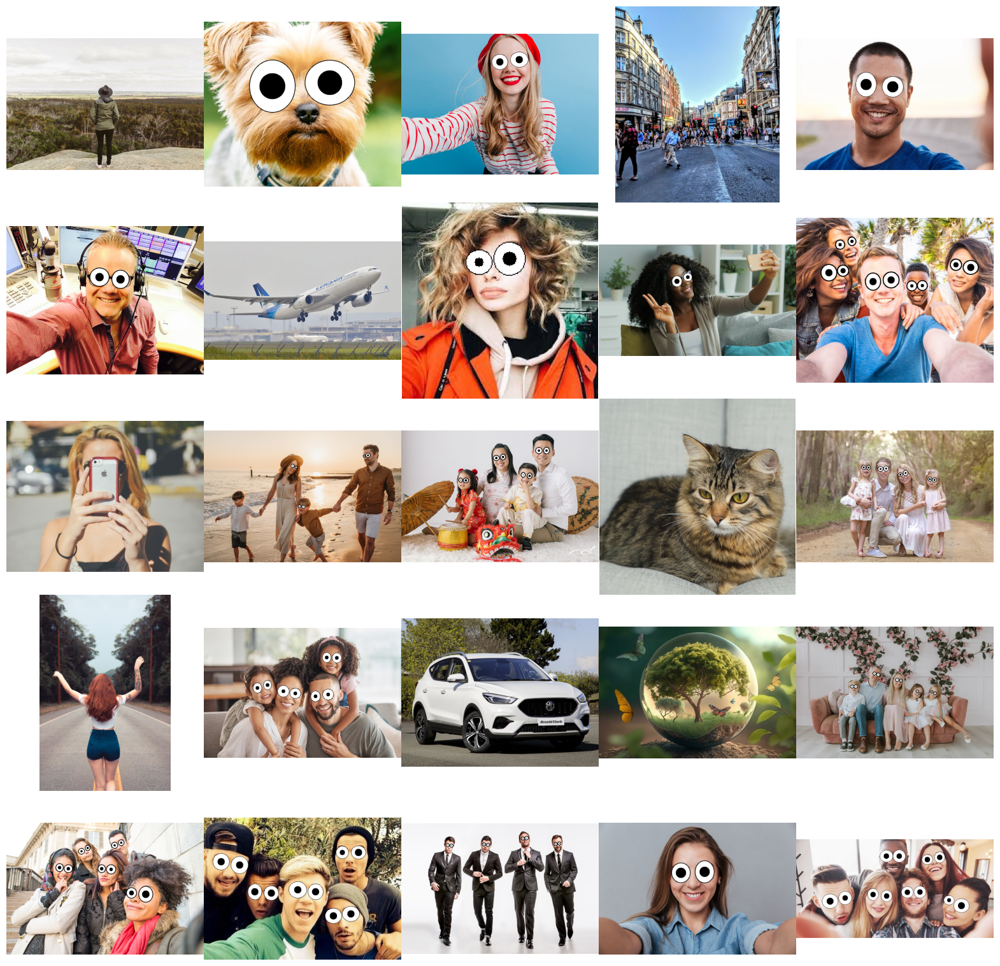

In [8]:
# Decided to use the DLIB approach
# This cell was used to develop the googly eyes drawing function
def draw(img, eyes):
    for (ex, ey ,ew, eh) in eyes:
        outline_thickness = 1 if img.shape[0] < 500 or img.shape[1] < 500 else 2
        center = (ew + ex) // 2, (eh + ey) // 2
        cover = max((ew - ex, eh - ey))
        pad = int(cover * .2)
        axes = random.randint(cover, cover+pad), random.randint(cover, cover+pad)
        cv2.ellipse(img, center, axes, 0., 0., 360, (255,255,255), -1)
        cv2.ellipse(img, center, axes, 0., 0., 360, (0,0,0), outline_thickness)
        cv2.circle(img, center, (pad * 3) - 1, (0,0,0), -1)

images = [cv2.imread(join("images", f)) for f in listdir("images")]
dlibgoogly = []

for img in images:
    cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    detections = detector(img, 1)
    faces = dlib.full_object_detections()

    for det in detections:
        faces.append(sp(img, det))
    
    right_eyes = [[face.part(i) for i in range(36, 42)] for face in faces]
    left_eyes = [[face.part(i) for i in range(42, 48)] for face in faces]
    
    right_eyes = [(min(eye, key=lambda x: x.x).x, min(eye, key=lambda x: x.y).y, max(eye, key=lambda x: x.x).x, max(eye, key=lambda x: x.y).y) for eye in right_eyes]
    left_eyes = [(min(eye, key=lambda x: x.x).x, min(eye, key=lambda x: x.y).y, max(eye, key=lambda x: x.x).x, max(eye, key=lambda x: x.y).y) for eye in left_eyes]

    draw(img, right_eyes)
    draw(img, left_eyes)
    
    dlibgoogly.append(img)

f, axarr = plt.subplots(len(images) // 5, 5)
plt.axis('off')
f.subplots_adjust(wspace=0, hspace=0)
f.set_figheight(20)
f.set_figwidth(20)
for i in range(5):
    for x in range(5):
        axarr[i,x].imshow(cv2.cvtColor(dlibgoogly[(i*5)+x], cv2.COLOR_RGB2BGR))
        axarr[i,x].axes.get_xaxis().set_visible(False)
        axarr[i,x].axes.get_xaxis().set_visible(False)
        axarr[i,x].axis('off')

# Evaluation

* The DLIB variation had much better performance in general.
* On the other hand the HAAR approach had a much faster run time.
* I decided to go with the DLIB approach since it had better performance. Although the runtime was slower, I would consider it fast enough for an API:
  * Approximation: 3 seconds / 25 images = 120ms per image
* One of the requirements was to randomize the orientation of the pupil, I ran out of time to implement this.
